In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import time
import os
import cv2
from PIL import Image
from tempfile import TemporaryDirectory
from pathlib import Path
cudnn.benchmark = True
plt.ion()  
from tqdm import tqdm
import torchvision.models as models
from collections import Counter
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix as sk_confusion_matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import warnings
from sklearn.exceptions import UndefinedMetricWarning

In [28]:
# Data normalization for training
data_transforms = {
    'Train_sorted': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Validation_sorted': transforms.Compose([
        transforms.Resize((256, 256)),
        #transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'Test_sorted': transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
}

data_dir = '/Users/inescocco/Desktop/ISIC2019'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['Train_sorted', 'Validation_sorted']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=32,
                                             shuffle=True, num_workers=0)
              for x in ['Train_sorted', 'Validation_sorted']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['Train_sorted', 'Validation_sorted']}
class_names = image_datasets['Train_sorted'].classes
print(class_names)

['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']


In [30]:
def get_validation_accuracy(model_path, val_dir, class_names, device):
    model = torch.load(model_path)
    model = model.to(device) 
    model.eval()  
    correct = 0
    total = 0

    # Iterating through each image in the validation directory
    for class_idx, class_name in enumerate(class_names):
        class_folder = os.path.join(val_dir, class_name)
        
        # Iterating through each image file in the class folder
        for filename in os.listdir(class_folder):
            if filename.endswith('.jpg') or filename.endswith('.png'): 
                image_path = os.path.join(class_folder, filename)
                img = Image.open(image_path).convert('RGB')

                # Applying the necessary transformations
                data_transforms = transforms.Compose([
                    transforms.Resize((256, 256)),
                    transforms.ToTensor(),
                    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                ])
                img_tensor = data_transforms(img).unsqueeze(0) 

                # Sending image tensor to the correct device
                img_tensor = img_tensor.to(device)

                # Forward pass: Get predictions
                outputs = model(img_tensor)
                _, preds = torch.max(outputs, 1)  # Getting the predicted class

                # Updating correct and total counts
                total += 1
                if preds.item() == class_idx:  # Comparing predicted class to the true class index
                    correct += 1

    accuracy = correct / total 
    return accuracy

def output_validation_accuracy(model_paths):
    validation_accuracies = []
    for model_path in model_paths:
        accuracy = get_validation_accuracy(model_path, val_dir, class_names, device)
        #print(accuracy)
        validation_accuracies.append(accuracy)
        
    return validation_accuracies

In [32]:
def load_models(model_paths, device):
    models = []
    for model in model_paths:
        model = torch.load(model, weights_only = False)
        model = model.to(device)
        model.eval()  
        models.append(model)
    return models

def calculate_ensemble_accuracy(results, class_names):
    """
    Calculate the accuracy of the ensemble predictions.

    Args:
        Results: List of tuples containing (image_file, model_preds, ensemble_pred, true_label).
        Class_names: List of class names.

    Returns:
        Accuracy: Accuracy of the ensemble predictions as a percentage.
    """
    correct = 0
    total = 0

    for _, _, ensemble_pred, true_label in results:
        # Converting the string labels to numeric indices for comparison
        ensemble_pred_index = class_names.index(ensemble_pred)
        true_label_index = class_names.index(true_label)

        # Checking if the prediction matches the true label
        if ensemble_pred_index == true_label_index:
            correct += 1
        total += 1

    # Calculating accuracy as a percentage
    accuracy = (correct / total) * 100 if total > 0 else 0
    return accuracy



In [34]:
def soft_ensemble_weighted(models, val_dir, class_names, device, val_accuracies):
    data_transforms = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    all_results = []  # Store predictions for all images
    model_weights = [w / sum(val_accuracies) for w in val_accuracies] 

    
    # Iterating through each class in the validation directory
    for class_idx, class_name in tqdm (enumerate(class_names), total=len(class_names), desc="Processing Classes"):
        class_folder = os.path.join(val_dir, class_name)

        # Iterating through each image in the class folder for prediction
        for filename in os.listdir(class_folder):
            if filename.endswith('.jpg') or filename.endswith('.png'):
                image_path = os.path.join(class_folder, filename)
                img = Image.open(image_path).convert('RGB')

                # Applying the necessary transformations
                img_tensor = data_transforms(img).unsqueeze(0).to(device) 

                # Initialising an empty list to store the model predictions (scores)
                model_scores = []
                
                # Getting predictions (raw scores or probabilities) from each model
                for model in models:
                    model.eval()  
                    with torch.no_grad():
                        outputs = model(img_tensor)  
                        model_scores.append(outputs.cpu().numpy())  

                # Converting model scores to a NumPy array
                model_scores = np.array(model_scores)  # Shape: [num_models, num_classes]

                # Computing the weighted average across models for each class
                avg_scores = np.average(model_scores, axis=0, weights=model_weights)  
                
                # Predicting the class with the highest average score
                final_pred = np.argmax(avg_scores)  

                # Storing the result: image file, model scores, ensemble prediction, and true label
                true_label = class_idx
                image_file = image_path
        
                # Formating each class score individually by iterating over the avg_scores array
                final_pred_named = class_names[final_pred]
                true_label_named = class_names[true_label]

                # Appending the results for this image
                all_results.append((image_file, avg_scores, final_pred_named, true_label_named))

    return all_results


def soft_print_predictions(results, class_names):
    # Iterating through the results
    for image_file, avg_scores, ensemble_pred_named, true_label_named in tqdm(results, desc="Printing Predictions"):
        # Extracting true label index
        true_label_index = class_names.index(true_label_named)
        
        # Printing image info
        print(f"Image: {image_file}")
        print(f"  True Label: {true_label_named}, {true_label_index}")
        print(f"Classes: {class_names}")
        print(f"Averages: {avg_scores}")
    
    
        # Printing ensemble prediction (both class name and numeric label)
        ensemble_pred_index = class_names.index(ensemble_pred_named)  # Get the numeric index of ensemble prediction
        print(f"  Ensemble Prediction: {ensemble_pred_named}, {ensemble_pred_index}")
        print("-" * 50)  # Separator for clarity


In [36]:
def soft_ensemble_weighted(models, val_dir, class_names, device, val_accuracies):
    data_transforms = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])
    
    all_results = []  # Store predictions for all images
    model_weights = [w / sum(val_accuracies) for w in val_accuracies] 

    
    # Iterating through each class in the validation directory
    for class_idx, class_name in tqdm(enumerate(class_names), total=len(class_names), desc="Processing Classes"):
        class_folder = os.path.join(val_dir, class_name)

        # Iterating through each image in the class folder for prediction
        for filename in os.listdir(class_folder):
            if filename.endswith('.jpg') or filename.endswith('.png'):
                image_path = os.path.join(class_folder, filename)
                img = Image.open(image_path).convert('RGB')

                # Applying the necessary transformations
                img_tensor = data_transforms(img).unsqueeze(0).to(device) 

                # Initialising an empty list to store the model predictions (scores)
                model_scores = []
                
                # Getting predictions (raw scores or probabilities) from each model
                for model in models:
                    model.eval()  # Set the model to evaluation mode
                    with torch.no_grad():
                        outputs = model(img_tensor)  # Get the raw outputs from the model
                        
                        # Ensuring consistent shape: [batch_size, num_classes]
                        if outputs.ndimension() == 2 and outputs.size(0) == 1:  
                            model_scores.append(outputs.cpu().numpy())
                        else:
                            # Squeezing extra dimensions
                            outputs_squeezed = outputs.squeeze(0).cpu().numpy() 
                            model_scores.append(outputs_squeezed)

                # Converting model scores to a NumPy array
                model_scores = np.array(model_scores)  # Shape: [num_models, num_classes]

                # Computing the weighted average across models for each class
                avg_scores = np.average(model_scores, axis=0, weights=model_weights) 
                
                # Predicting the class with the highest average score
                final_pred = np.argmax(avg_scores)  

                # Storing the result: image file, model scores, ensemble prediction, and true label
                true_label = class_idx
                image_file = image_path
        
                # Formatting each class score individually by iterating over the avg_scores array
                final_pred_named = class_names[final_pred]
                true_label_named = class_names[true_label]

                # Appending the results for this image
                all_results.append((image_file, avg_scores, final_pred_named, true_label_named))

    return all_results


In [43]:
model_paths = ["pytorch_finetuned_b7_full_1.pth", "model_b7_full_2.pth", "model_b7_epoch_4_3.pth"]
val_dir = '/Users/inescocco/Desktop/ISIC2019/Validation_sorted'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#validation_accuracies = output_validation_accuracy(model_paths)
validation_accuracies = [0.81, 0.7297368421052631, 0.7497368421052631]
models = load_models(model_paths, device)

In [44]:
image_folder_path = '/Users/inescocco/Desktop/ISIC2019/Validation_sorted/AK' 

# Getting a list of all image files in the folder (jpg or png)
image_files = [f for f in os.listdir(image_folder_path) if f.endswith(('.jpg', '.png'))]

# Randomly selecting an image from the folder
random_image = random.choice(image_files)
image_path = os.path.join(image_folder_path, random_image)

# Transformation to be applied to the image
data_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Loading the image and apply transformations
img = Image.open(image_path).convert('RGB')
img_tensor = data_transforms(img).unsqueeze(0)  # Add batch dimension

# Moving to the appropriate device (cuda or cpu)
img_tensor = img_tensor.to(device)

# Looping through each model and check the output shape
for model_idx, model in enumerate(models):
    model.eval()  # Set the model to evaluation mode
    with torch.no_grad():  # Disable gradient computation
        outputs = model(img_tensor)  # Get the raw outputs from the model
        print(f"Model {model_idx+1} output shape: {outputs.shape}")


Model 1 output shape: torch.Size([1, 8])
Model 2 output shape: torch.Size([1, 8])
Model 3 output shape: torch.Size([1, 8])


## Using Weighted Soft Voting Ensemble

In [47]:
soft_results_weighted = soft_ensemble_weighted(models, val_dir, class_names, device, validation_accuracies)

Processing Classes: 100%|█████████████████████| 8/8 [4:51:41<00:00, 2187.66s/it]


In [8]:
soft_print_predictions(soft_results_weighted, class_names)

Printing Predictions:  69%|█████████▋    | 2625/3800 [00:00<00:00, 13315.84it/s]

Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/AK/ISIC_0062878.jpg
  True Label: AK, 0
Classes: ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']
Averages: [[ 4.72012837  6.09623915  1.85475572 -4.11931851 -2.35705237 -2.34531666
  -3.4479587  -3.63231087]]
  Ensemble Prediction: BCC, 1
--------------------------------------------------
Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/AK/ISIC_0069939.jpg
  True Label: AK, 0
Classes: ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']
Averages: [[ 4.47218498  0.99952799 -0.60034416 -2.48235488  2.21389358 -2.67024668
  -0.38695284 -3.01281398]]
  Ensemble Prediction: AK, 0
--------------------------------------------------
Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/AK/ISIC_0056101.jpg
  True Label: AK, 0
Classes: ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']
Averages: [[ 6.87012266  0.79145229 -1.35861881 -2.36695503  0.01888714 -1.11089291
  -1.33859859 -2.09214964]]
  Ensemble Pre

Printing Predictions: 100%|██████████████| 3800/3800 [00:00<00:00, 13180.22it/s]

Averages: [[-2.3563082  -1.14217796 -0.08779938 -2.79256419  1.49618297  7.37311877
  -3.30289632 -2.22250792]]
  Ensemble Prediction: NV, 5
--------------------------------------------------
Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/NV/ISIC_0025094.jpg
  True Label: NV, 5
Classes: ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']
Averages: [[-3.10018524 -0.99675954  2.78773021 -4.0609681   1.44671347  5.54926845
  -2.51045768 -1.68516962]]
  Ensemble Prediction: NV, 5
--------------------------------------------------
Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/NV/ISIC_0059407.jpg
  True Label: NV, 5
Classes: ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC']
Averages: [[-4.46039783  3.56148131 -1.71516782 -3.17274052  1.57463522  4.71021782
  -1.98789072 -1.98968381]]
  Ensemble Prediction: NV, 5
--------------------------------------------------
Image: /Users/inescocco/Desktop/ISIC2019/Validation_sorted/NV/ISIC_0014158_downsampled.jpg
  True 

In [10]:
ensemble_accuracy = calculate_ensemble_accuracy(soft_results_weighted, class_names)
print(f"Weighted Soft Voting Ensemble Accuracy: {ensemble_accuracy:.2f}%")

Weighted Soft Voting Ensemble Accuracy: 81.45%


In [62]:
def compute_gradCAM_ensemble(model_paths, results, folder_path, class_names, device):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    def show_cam_on_image(img, mask, intensity=0.6):
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255  # Normaliing heatmap to [0, 1]
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  # Converting BGR to RGB
        cam = heatmap * intensity + img * (1 - intensity)
        return np.uint8(255 * cam)
    
    # Tracking processed classes
    processed_classes = set()

    for result in results:
        image_file, avg_scores, ensemble_pred_named, true_label_named = result

        # Skipping if we've already processed the current class
        if true_label_named in processed_classes:
            continue

        # Loading the image
        img_pil = Image.open(image_file).convert('RGB')
        input_tensor = transform(img_pil).unsqueeze(0).to(device)

        models = []

        for model_path in model_paths:
            model = torch.load(model_path, weights_only=False)  
            model.eval()  # Set the model to evaluation mode
            models.append(model)

        # Defining a variable to store activations of the last layer
        middle_layer_activations = None

        # Hooking function to capture activations from the target layer
        def hook_fn(module, input, output):
            nonlocal middle_layer_activations
            middle_layer_activations = output
            middle_layer_activations.requires_grad_(True)
            middle_layer_activations.retain_grad()

        # Registering hook on the last layer of the model
        target_layer = models[0].features[-1]  
        hook = target_layer.register_forward_hook(hook_fn)

        # Performing a forward pass on one model to get the raw scores 
        model = models[0]
        output = model(input_tensor)

        # Getting the ensemble prediction index
        final_pred = np.argmax(avg_scores) 

        # Backpropagating for the ensemble predicted class
        model.zero_grad()
        output[0, final_pred].backward()  

        # Getting the gradients and activations
        gradients = middle_layer_activations.grad.data
        pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])

        # Weighting activations by gradients to get the heatmap
        activations = middle_layer_activations.detach().cpu().numpy()[0]
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i].cpu().numpy()
        heatmap = np.mean(activations, axis=0)

        # Normalising and resize the heatmap
        heatmap = np.maximum(heatmap, 0)
        if np.max(heatmap) != 0:
            heatmap /= np.max(heatmap)

        heatmap = cv2.resize(heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)

        # Overlaying the heatmap on the original image
        img = np.array(img_pil, dtype=np.float32) / 255.0
        visualisation = show_cam_on_image(img, heatmap, intensity=0.5)

        # Displaying original image and Grad-CAM visualization
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].imshow(np.array(img_pil))
        axs[0].text(0.5, 1.1, image_file.split('/')[-1], size=12, ha="center", transform=axs[0].transAxes)
        axs[0].set_title(f"Original Image ({true_label_named})", fontsize=14)
        axs[0].axis('off')

        axs[1].imshow(visualisation)
        axs[1].set_title(f"Grad-CAM: {ensemble_pred_named}", fontsize=14)
        axs[1].axis('off')

        plt.show()

        # Mark the current class as processed
        processed_classes.add(true_label_named)



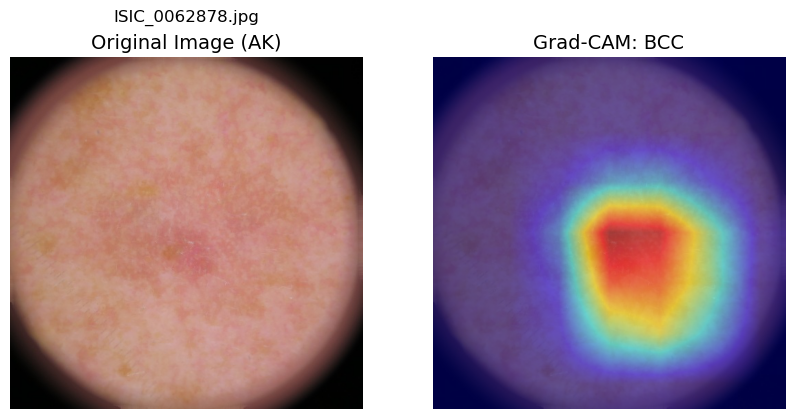

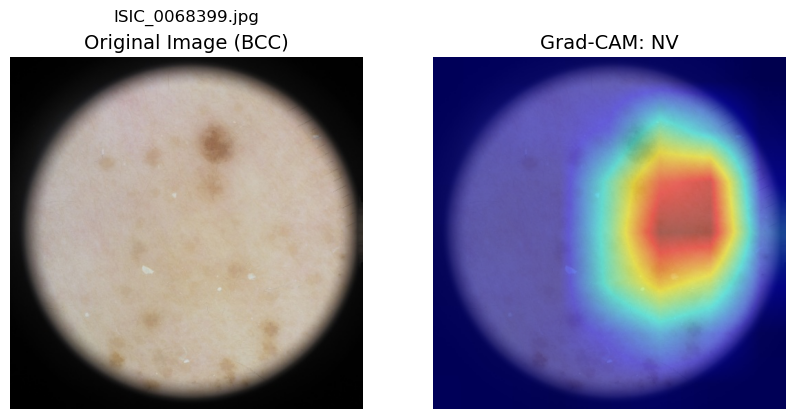

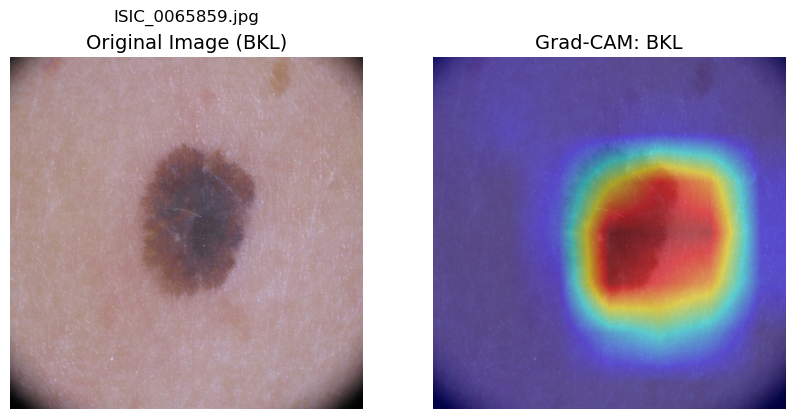

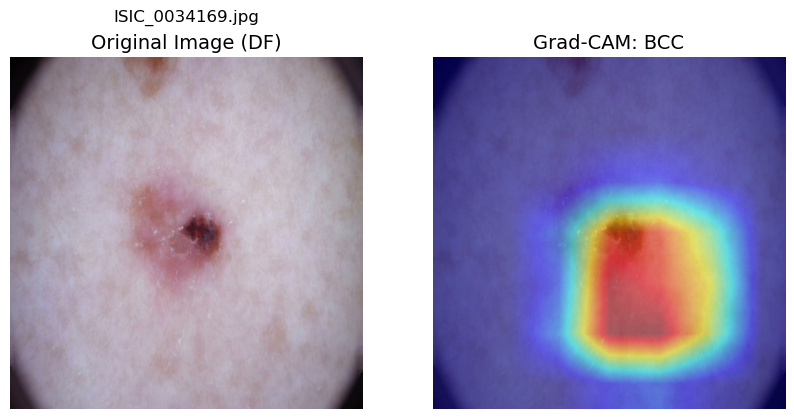

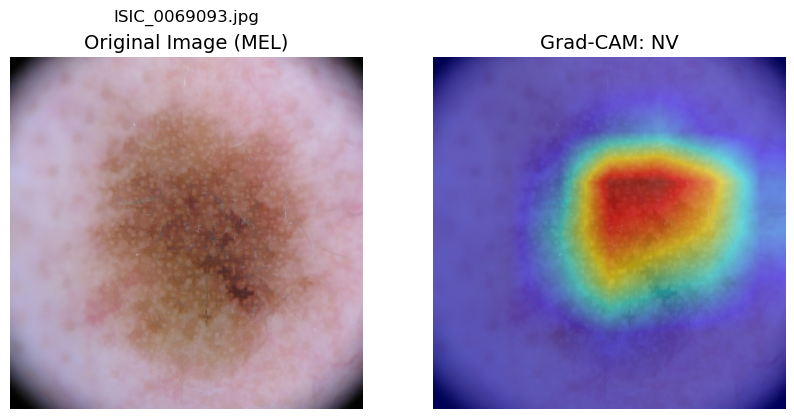

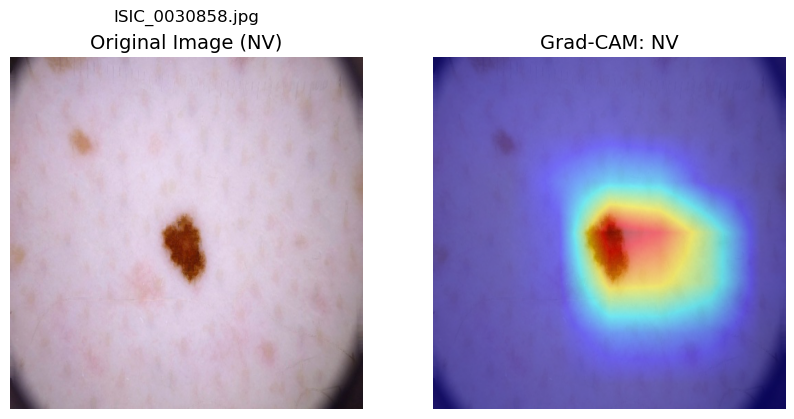

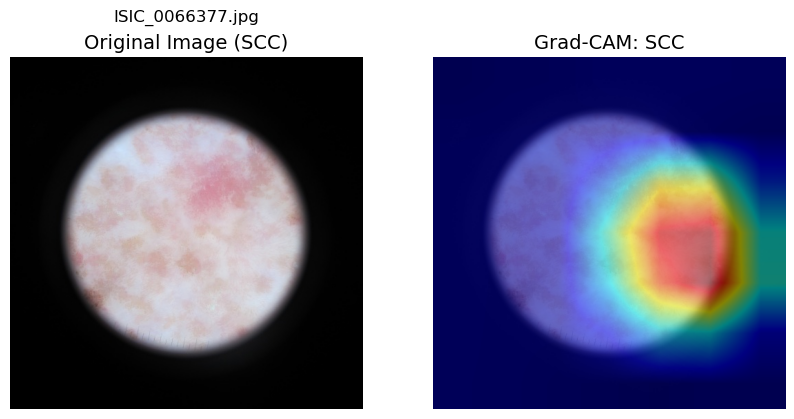

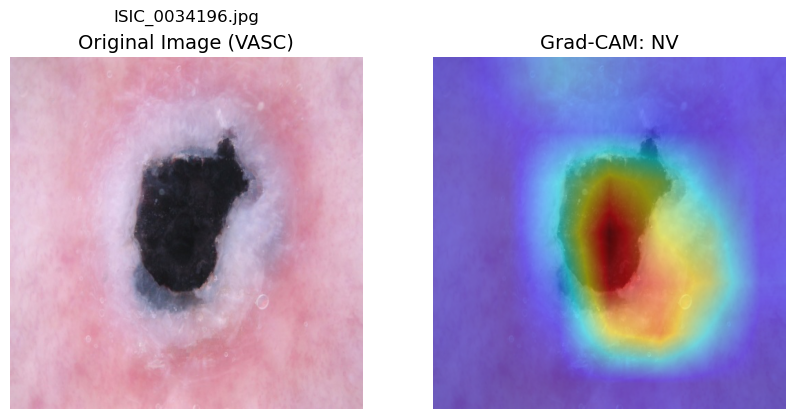

In [63]:
# Now visualize the Grad-CAMs for the ensemble predictions
compute_gradCAM_ensemble(model_paths, soft_results_weighted, val_dir, class_names, device)


In [46]:
def compute_gradCAMplusplus_ensemble(model_paths, results, folder_path, class_names, device):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    def show_cam_on_image(img, mask, intensity=0.6):
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255  # Normalising heatmap to [0, 1]
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  # Converting BGR to RGB
        cam = heatmap * intensity + img * (1 - intensity)
        return np.uint8(255 * cam)

    # Tracking processed classes
    processed_classes = set()

    for result in results:
        image_file, avg_scores, ensemble_pred_named, true_label_named = result

        # Skipping if we've already processed the current class
        if true_label_named in processed_classes:
            continue

        # Loading the image
        img_pil = Image.open(image_file).convert('RGB')
        input_tensor = transform(img_pil).unsqueeze(0).to(device)

        models = []

        for model_path in model_paths:
            model = torch.load(model_path, weights_only=False) 
            model.eval()  
            models.append(model)

        # Defining a variable to store activations of the last layer
        middle_layer_activations = None

        # Hooking function to capture activations from the target layer
        def hook_fn(module, input, output):
            nonlocal middle_layer_activations
            middle_layer_activations = output
            middle_layer_activations.requires_grad_(True)
            middle_layer_activations.retain_grad()

        # Registering hook on the last layer of the model 
        target_layer = models[0].features[-1] 
        hook = target_layer.register_forward_hook(hook_fn)

        # Performing a forward pass on one model to get the raw scores
        model = models[0]
        output = model(input_tensor)

        # Getting the ensemble prediction index
        final_pred = np.argmax(avg_scores)  # Ensemble prediction

        # Backpropagating for the ensemble predicted class
        model.zero_grad()
        output[0, final_pred].backward()  # Compute gradient for ensemble predicted class

        # Getting the gradients and activations
        gradients = middle_layer_activations.grad.data
        activations = middle_layer_activations.detach().cpu().numpy()[0]

        # Grad-CAM++ specific: Use higher-order gradients (alpha, beta, gamma)
        alpha = torch.clamp(gradients, min=0)  
        beta = torch.clamp(gradients, min=0)  
        gamma = torch.clamp(gradients, min=0)  

        # Weighted activations (Grad-CAM++ formula)
        weighted_activations = np.zeros_like(activations)

        for i in range(activations.shape[0]):
            weighted_activations[i, :, :] = activations[i, :, :] * (alpha[0, i, :, :].cpu().numpy() + 
                                                                   beta[0, i, :, :].cpu().numpy() ** 2 + 
                                                                   gamma[0, i, :, :].cpu().numpy() ** 3)

        # Summing the weighted activations across all channels
        heatmap = np.sum(weighted_activations, axis=0)

        # Normalising and resize the heatmap
        heatmap = np.maximum(heatmap, 0)
        if np.max(heatmap) != 0:
            heatmap /= np.max(heatmap)

        heatmap = cv2.resize(heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)

        # Overlaying the heatmap on the original image
        img = np.array(img_pil, dtype=np.float32) / 255.0
        visualisation = show_cam_on_image(img, heatmap, intensity=0.5)

        # Displaying original image and Grad-CAM++ visualization
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].imshow(np.array(img_pil))
        axs[0].text(0.5, 1.1, image_file.split('/')[-1], size=12, ha="center", transform=axs[0].transAxes)
        axs[0].set_title(f"Original Image ({true_label_named})", fontsize=14)
        axs[0].axis('off')

        axs[1].imshow(visualisation)
        axs[1].set_title(f"Grad-CAM++: {ensemble_pred_named}", fontsize=14)
        axs[1].axis('off')

        plt.show()

        # Mark the current class as processed
        processed_classes.add(true_label_named)

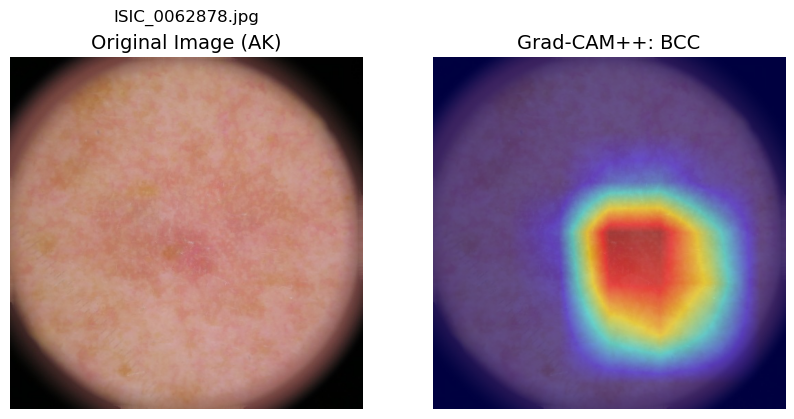

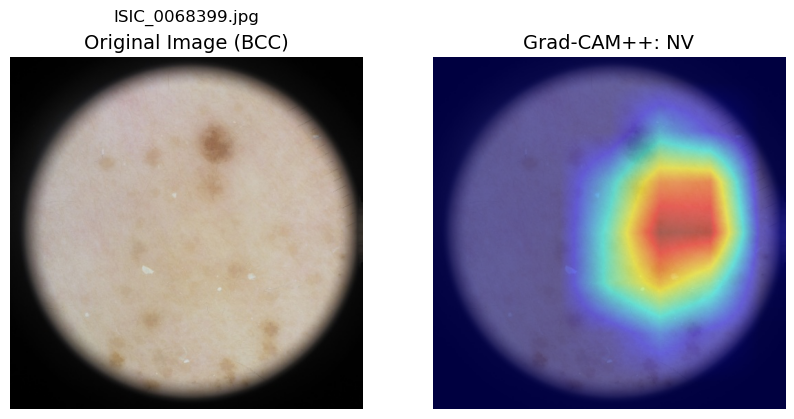

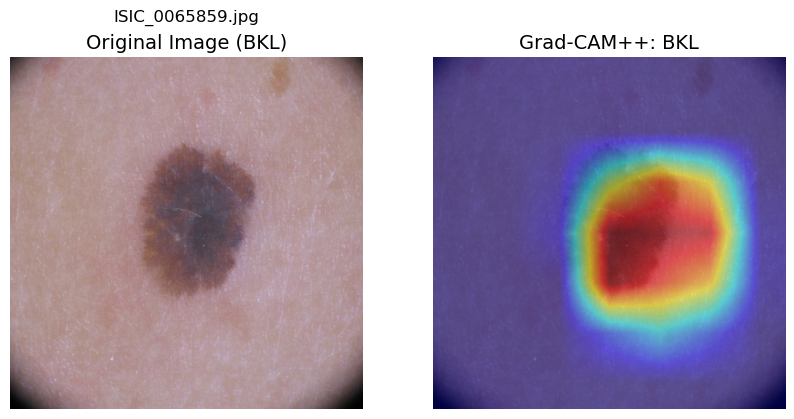

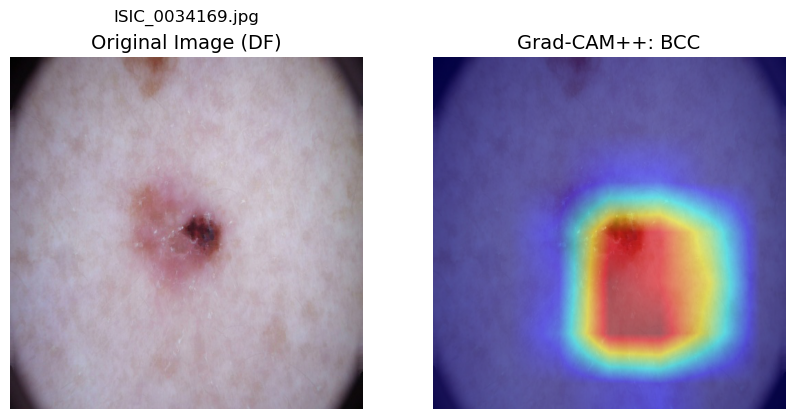

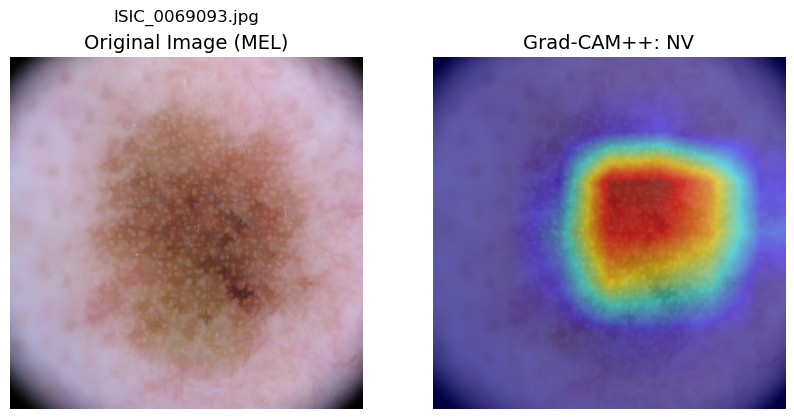

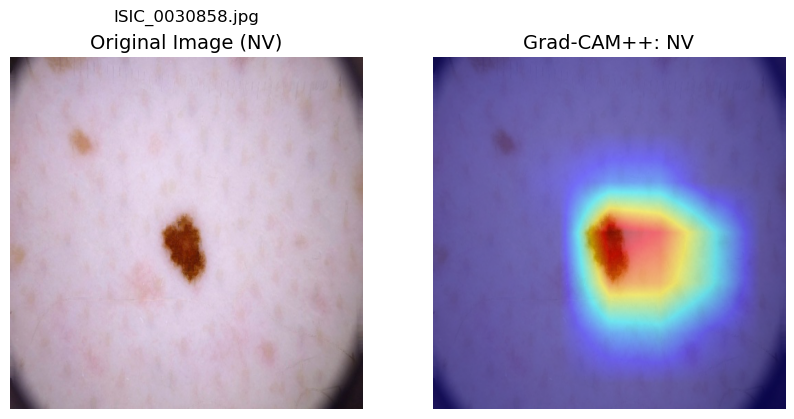

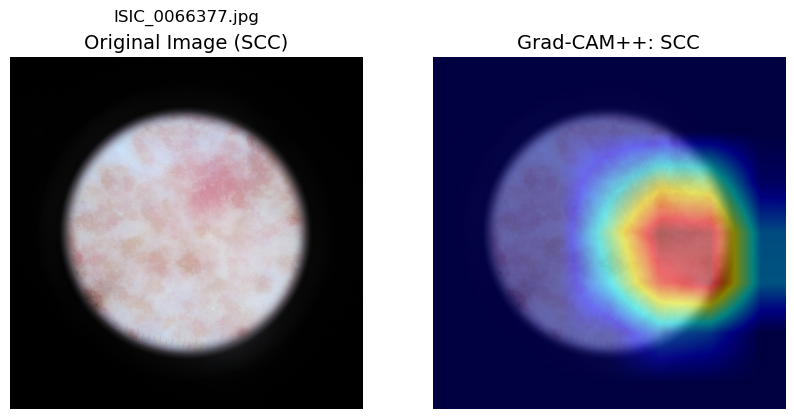

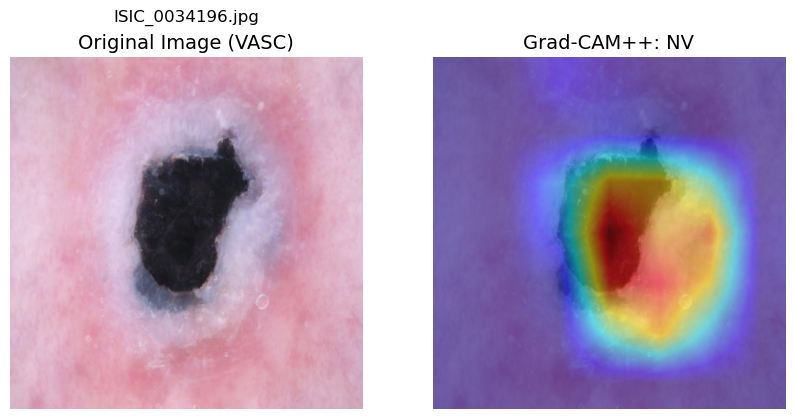

In [47]:
compute_gradCAMplusplus_ensemble(model_paths, soft_results_weighted, val_dir, class_names, device)

In [64]:
def compute_ScoreCAM_ensemble(model_paths, results, folder_path, class_names, max_scorecam_channels=50):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = transforms.Compose([
        transforms.Resize((224, 224)),  
        transforms.ToTensor(),  
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  
    ])
    
    def show_cam_on_image(img, mask, intensity=0.6):
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255  
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  
        cam = heatmap * intensity + img * (1 - intensity)
        return np.uint8(255 * cam)  

    # Tracking processed classes
    processed_classes = set()

    for result in results:
        image_file, avg_scores, ensemble_pred_named, true_label_named = result

        # Skip if we've already processed the current class
        if true_label_named in processed_classes:
            continue

        print(f"Processing {image_file}...")
        print('Actual class:', true_label_named)

        img_pil = Image.open(image_file).convert('RGB')
        input_tensor = transform(img_pil).unsqueeze(0).to(device)

        models = []
        for model_path in model_paths:
            model = torch.load(model_path, weights_only=False)
            model.eval()
            models.append(model)

        # Hooking function to capture activations from the target layer
        middle_layer_activations = None

        def hook_fn(module, input, output):
            nonlocal middle_layer_activations
            middle_layer_activations = output

        # Registering hook on the last layer of the first model
        target_layer = models[0].features[-1]  
        hook = target_layer.register_forward_hook(hook_fn)

        # Forward pass through one model
        output = models[0](input_tensor)

        # Getting the ensemble prediction index
        final_pred = np.argmax(avg_scores)  # Ensemble prediction index
        print(f"Predicted class (Ensemble): {ensemble_pred_named}")

        # Score-CAM Calculation
        print("[INFO] Computing Score-CAM...")
        activations = middle_layer_activations.detach().cpu().numpy()[0]  
        num_activations = min(activations.shape[0], max_scorecam_channels)  
        score_weights = []

        for i in range(num_activations):
            if i % 10 == 0:
                print(f"Processing activation map {i}/{num_activations}")

            mask = activations[i, :, :]
            mask = np.maximum(mask, 0)  
            if np.max(mask) != 0:
                mask /= np.max(mask)  

            mask_resized = cv2.resize(mask, (input_tensor.shape[2], input_tensor.shape[3]))
            mask_tensor = torch.tensor(mask_resized, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device)

            # Forward pass with perturbed image for each model and get weighted score
            perturbed_score = 0
            for model in models:
                perturbed_output = model(input_tensor * mask_tensor)
                perturbed_score += perturbed_output[0, final_pred].item() / len(models) 
            score_weights.append(perturbed_score)

        # Normalising scores
        score_weights = np.array(score_weights)
        if np.max(score_weights) != 0:
            score_weights /= np.max(score_weights)

        # Computing final Score-CAM heatmap
        scorecam_heatmap = np.zeros_like(activations[0])
        for i in range(num_activations):
            scorecam_heatmap += activations[i] * score_weights[i]

        scorecam_heatmap = np.maximum(scorecam_heatmap, 0)
        if np.max(scorecam_heatmap) != 0:
            scorecam_heatmap /= np.max(scorecam_heatmap)
        scorecam_heatmap_resized = cv2.resize(scorecam_heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)

        # Visualizations
        img = np.array(img_pil, dtype=np.float32) / 255.0  
        visualisation = show_cam_on_image(img, scorecam_heatmap_resized, intensity=0.5)

        # Display Original Image and Score-CAM Visualization
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))

        axs[0].imshow(np.array(img_pil))  
        axs[0].set_title(f"Original Image ({true_label_named})", fontsize=14)
        axs[0].axis('off')

        axs[1].imshow(visualisation)
        axs[1].set_title(f"Score-CAM: {ensemble_pred_named}", fontsize=14)
        axs[1].axis('off')

        plt.show()

        # Marking the current class as processed
        processed_classes.add(true_label_named)


Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/AK/ISIC_0062878.jpg...
Actual class: AK
Predicted class (Ensemble): BCC
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


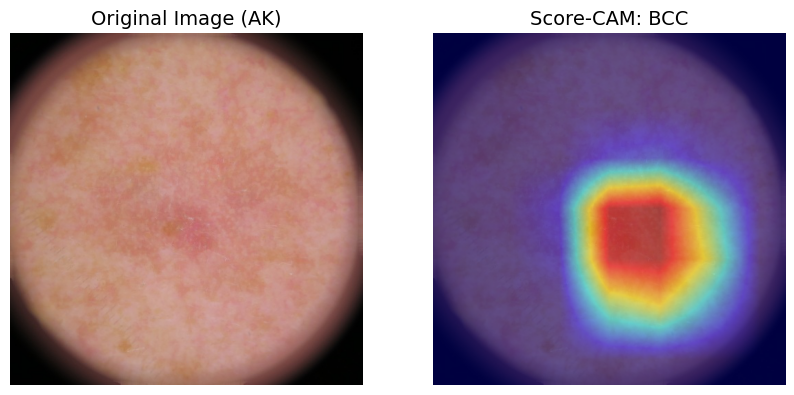

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/BCC/ISIC_0068399.jpg...
Actual class: BCC
Predicted class (Ensemble): NV
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


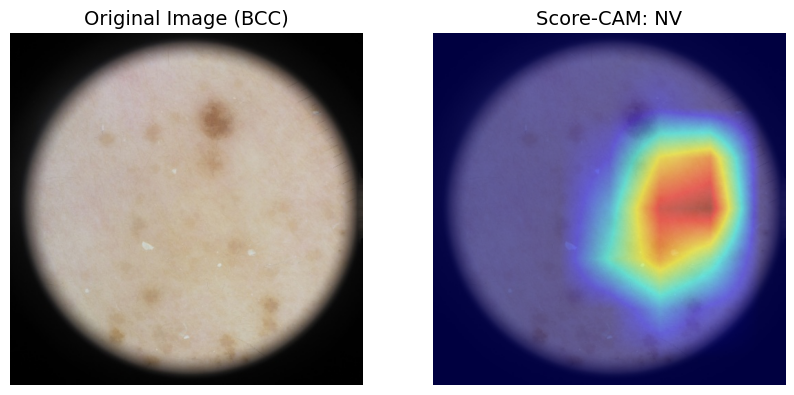

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/BKL/ISIC_0065859.jpg...
Actual class: BKL
Predicted class (Ensemble): BKL
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


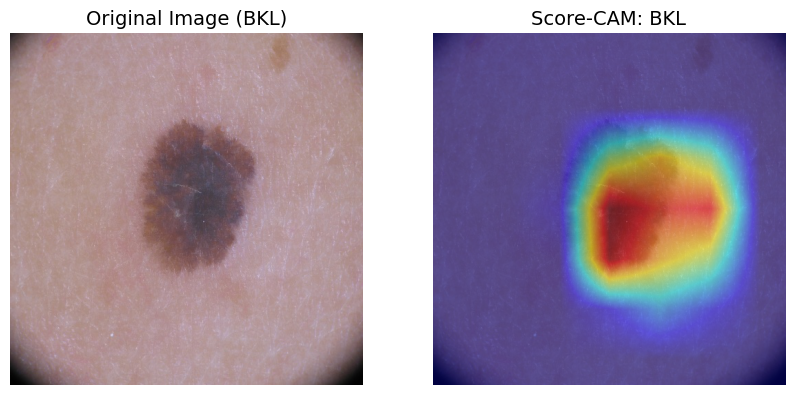

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/DF/ISIC_0034169.jpg...
Actual class: DF
Predicted class (Ensemble): BCC
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


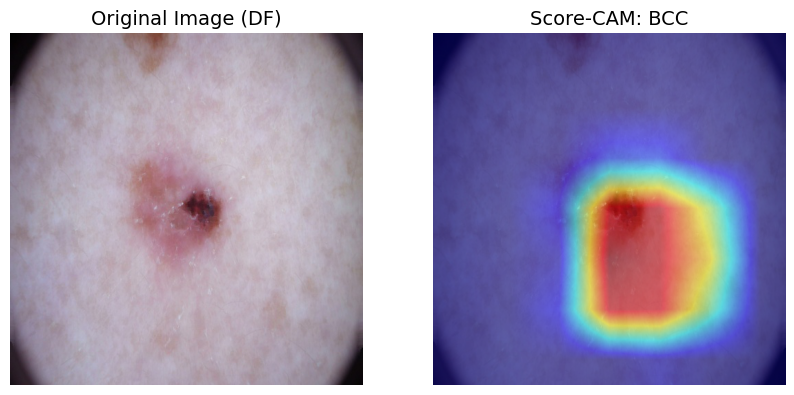

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/MEL/ISIC_0069093.jpg...
Actual class: MEL
Predicted class (Ensemble): NV
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


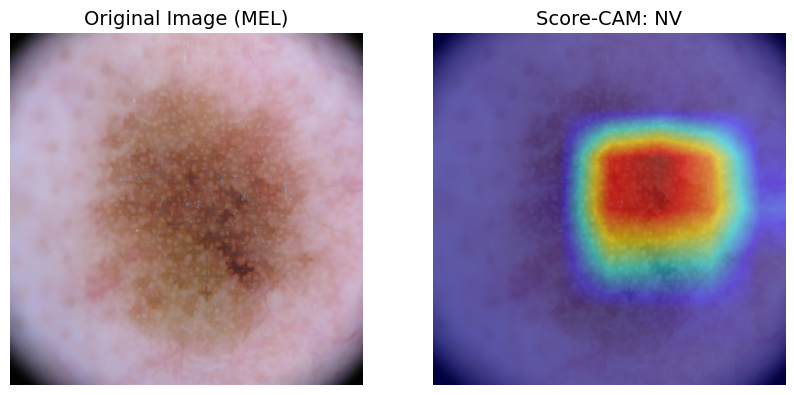

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/NV/ISIC_0030858.jpg...
Actual class: NV
Predicted class (Ensemble): NV
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


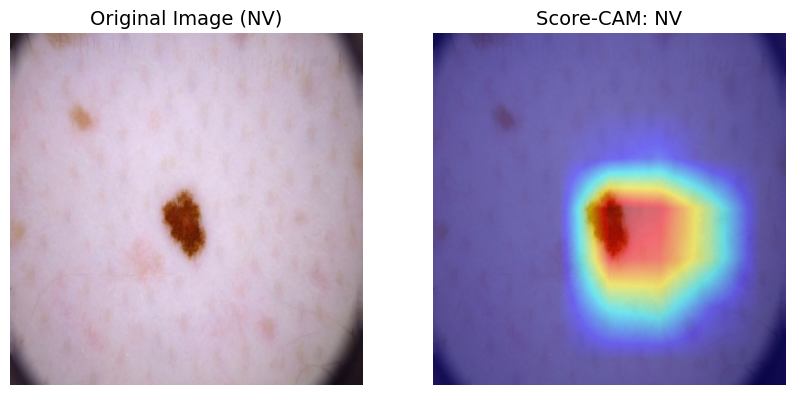

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/SCC/ISIC_0066377.jpg...
Actual class: SCC
Predicted class (Ensemble): SCC
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


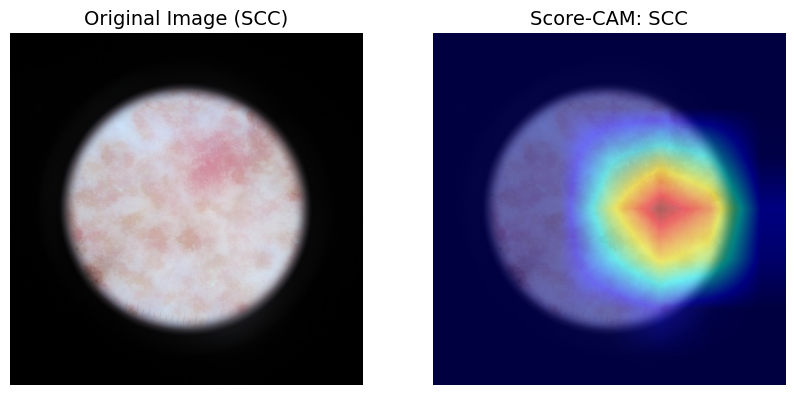

Processing /Users/inescocco/Desktop/ISIC2019/Validation_sorted/VASC/ISIC_0034196.jpg...
Actual class: VASC
Predicted class (Ensemble): NV
[INFO] Computing Score-CAM...
Processing activation map 0/50
Processing activation map 10/50
Processing activation map 20/50
Processing activation map 30/50
Processing activation map 40/50


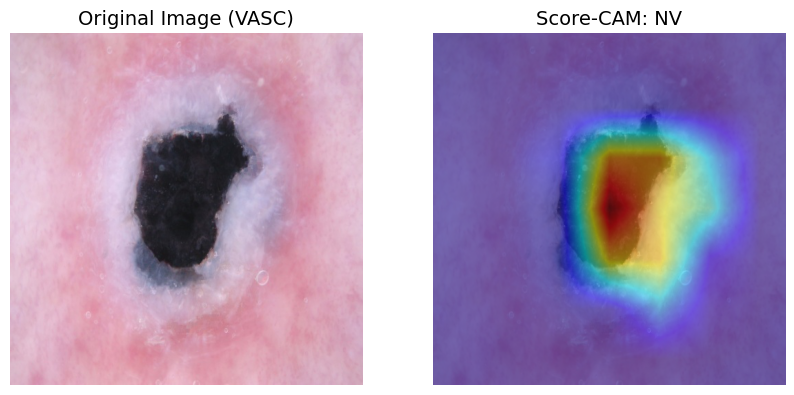

In [65]:
compute_ScoreCAM_ensemble(model_paths, soft_results_weighted, val_dir, class_names, max_scorecam_channels=50)

In [74]:
def compute_CAM_ensemble(model_paths, results, folder_path, class_names, device, max_scorecam_channels=50):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    def show_cam_on_image(img, mask, intensity=0.6):
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
        heatmap = np.float32(heatmap) / 255  # Normaliing heatmap to [0, 1]
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)  # Converting BGR to RGB
        cam = heatmap * intensity + img * (1 - intensity)
        return np.uint8(255 * cam)

    # Track processed classes
    processed_classes = set()

    for result in results:
        image_file, avg_scores, ensemble_pred_named, true_label_named = result

        if true_label_named in processed_classes:
            continue

        img_pil = Image.open(image_file).convert('RGB')
        input_tensor = transform(img_pil).unsqueeze(0).to(device)

        models = [torch.load(model_path, weights_only=False).eval() for model_path in model_paths]
        
        middle_layer_activations = None
        def hook_fn(module, input, output):
            nonlocal middle_layer_activations
            middle_layer_activations = output
            middle_layer_activations.requires_grad_(True)
            middle_layer_activations.retain_grad()
        
        target_layer = models[0].features[-1]
        hook = target_layer.register_forward_hook(hook_fn)

        model = models[0]
        output = model(input_tensor)
        final_pred = np.argmax(avg_scores)
        model.zero_grad()
        output[0, final_pred].backward()

        gradients = middle_layer_activations.grad.data
        pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
        activations = middle_layer_activations.detach().cpu().numpy()[0]

        gradcam_heatmap = np.mean([activations[i] * pooled_gradients[i].cpu().numpy() for i in range(activations.shape[0])], axis=0)
        gradcam_heatmap = np.maximum(gradcam_heatmap, 0) / np.max(gradcam_heatmap) if np.max(gradcam_heatmap) != 0 else gradcam_heatmap

        alpha = torch.clamp(gradients, min=0)
        beta = torch.clamp(gradients, min=0)
        gamma = torch.clamp(gradients, min=0)
        gradcampp_heatmap = np.sum([activations[i] * (alpha[0, i, :, :].cpu().numpy() + beta[0, i, :, :].cpu().numpy() ** 2 + gamma[0, i, :, :].cpu().numpy() ** 3) for i in range(activations.shape[0])], axis=0)
        gradcampp_heatmap = np.maximum(gradcampp_heatmap, 0) / np.max(gradcampp_heatmap) if np.max(gradcampp_heatmap) != 0 else gradcampp_heatmap

        num_activations = min(activations.shape[0], max_scorecam_channels)
        score_weights = np.array([torch.mean(models[0](input_tensor * torch.tensor(cv2.resize(np.maximum(activations[i], 0) / np.max(activations[i]) if np.max(activations[i]) != 0 else activations[i], (input_tensor.shape[2], input_tensor.shape[3]))[None, None, :, :], dtype=torch.float32).to(device))[0, final_pred]).item() for i in range(num_activations)])
        scorecam_heatmap = np.sum([activations[i] * (score_weights[i] / np.max(score_weights) if np.max(score_weights) != 0 else score_weights[i]) for i in range(num_activations)], axis=0)
        scorecam_heatmap = np.maximum(scorecam_heatmap, 0) / np.max(scorecam_heatmap) if np.max(scorecam_heatmap) != 0 else scorecam_heatmap

        gradcam_heatmap = cv2.resize(gradcam_heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)
        gradcampp_heatmap = cv2.resize(gradcampp_heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)
        scorecam_heatmap = cv2.resize(scorecam_heatmap, (img_pil.size[0], img_pil.size[1]), interpolation=cv2.INTER_LINEAR)

        img = np.array(img_pil, dtype=np.float32) / 255.0
        gradcam_vis = show_cam_on_image(img, gradcam_heatmap, intensity=0.5)
        gradcampp_vis = show_cam_on_image(img, gradcampp_heatmap, intensity=0.5)
        scorecam_vis = show_cam_on_image(img, scorecam_heatmap, intensity=0.5)

        fig, axs = plt.subplots(1, 4, figsize=(15, 5))
        axs[0].imshow(np.array(img_pil))
        axs[0].set_title(f"Original ({true_label_named})", fontsize=14)
        axs[0].axis('off')
        axs[1].imshow(gradcam_vis)
        axs[1].set_title(f"Grad-CAM: {ensemble_pred_named}", fontsize=14)
        axs[1].axis('off')
        axs[2].imshow(gradcampp_vis)
        axs[2].set_title(f"Grad-CAM++: {ensemble_pred_named}", fontsize=14)
        axs[2].axis('off')
        axs[3].imshow(scorecam_vis)
        axs[3].set_title(f"Score-CAM: {ensemble_pred_named}", fontsize=14)
        axs[3].axis('off')
        plt.show()

        processed_classes.add(true_label_named)


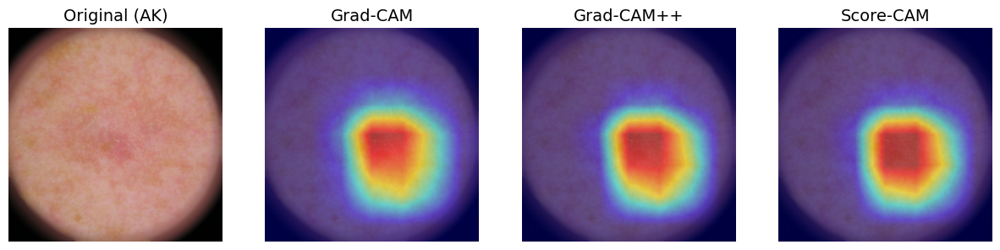

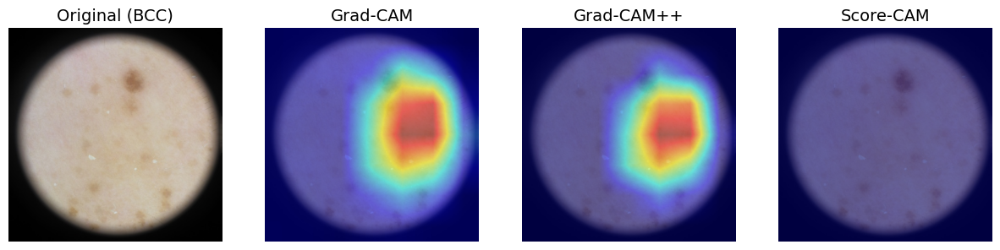

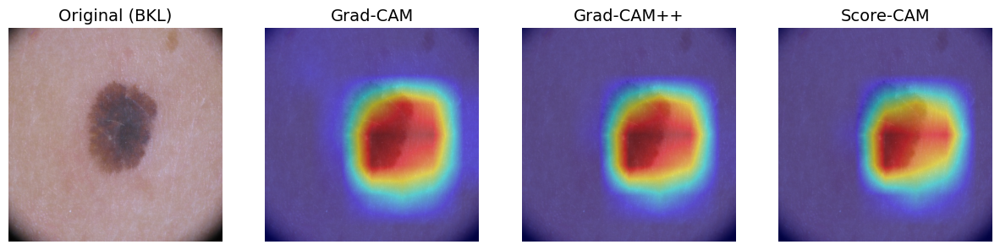

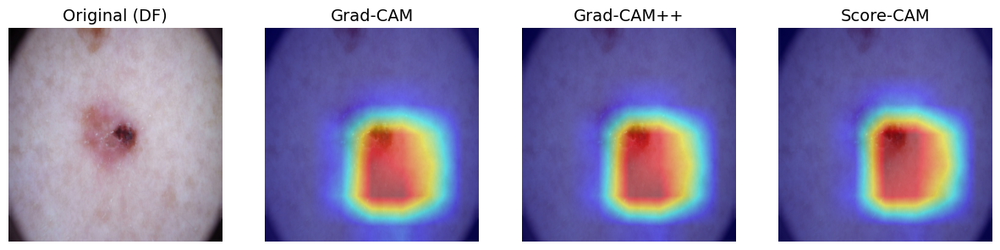

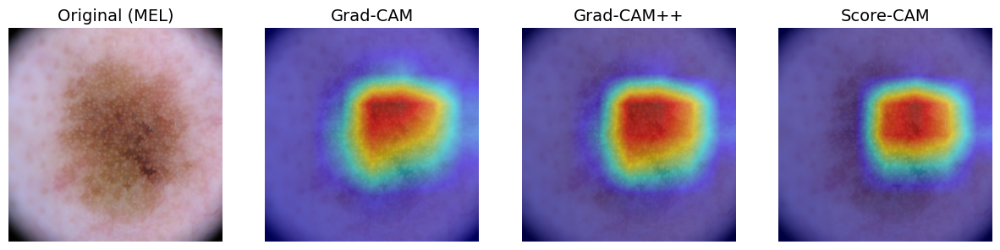

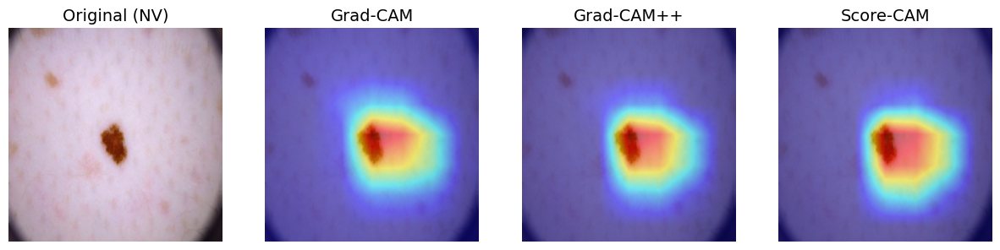

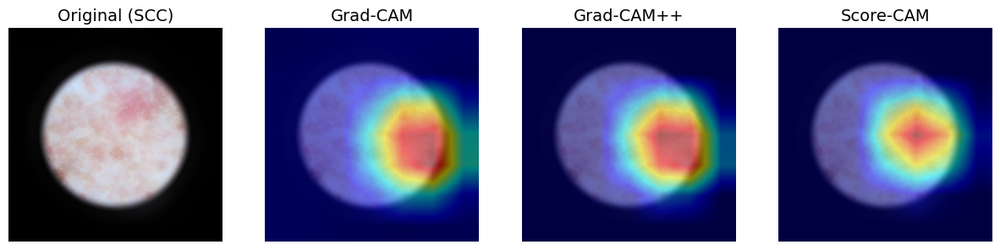

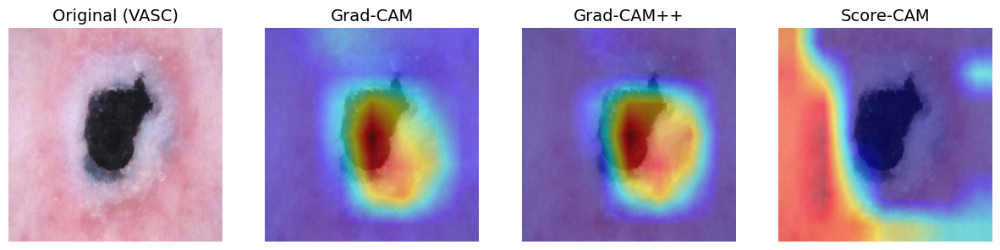

In [75]:
compute_CAM_ensemble(model_paths, soft_results_weighted, val_dir, class_names, device, max_scorecam_channels=50)